In [27]:
# !pip install catboost imblearn joblib lightgbm matplotlib numpy optuna mlflow scikit-learn pandas seaborn tqdm ucimlrepo xgboost

In [28]:
# Imports padrão do Python
import math
import os
import pickle
import time
import warnings
from collections import Counter, defaultdict
from datetime import datetime  # Adicionado
from itertools import combinations
from urllib.parse import urlparse

# Imports de bibliotecas de terceiros
import catboost
import joblib
import lightgbm
import matplotlib.gridspec as GridSpec
import matplotlib.pyplot as plt
import mlflow
import mlflow.sklearn
import numpy as np
import optuna
import pandas as pd
import seaborn as sns
from catboost import CatBoostClassifier
from imblearn.over_sampling import SMOTE
from lightgbm import LGBMClassifier
from optuna.visualization import plot_optimization_history, plot_param_importances
from pandas import DataFrame
from scipy import stats
from sklearn.base import clone
from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier
from sklearn.exceptions import ConvergenceWarning  # Adicionado
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.feature_selection import chi2  # Adicionado
from sklearn.feature_selection import VarianceThreshold  # Adicionado
from sklearn.feature_selection import SelectFromModel  # Adicionado
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    accuracy_score,
    classification_report,
    confusion_matrix,
    f1_score,
    roc_auc_score,
)
from sklearn.model_selection import GridSearchCV, StratifiedKFold, cross_val_score, train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from ucimlrepo import fetch_ucirepo
from xgboost import XGBClassifier
from tqdm import tqdm

In [29]:
# Configurações
np.random.seed(42)  # Para reprodutibilidade
plt.style.use("ggplot")

# Parâmetros do algoritmo genético
POPULATION_SIZE = 20
MIN_FEATURES = 2
MAX_FEATURES = 14  # Limitado pelo maior k testado
MAX_GENERATIONS = 15
ELITE_PERCENT = 0.2
MUTATION_PROBABILITY = 0.1

In [30]:
# from google.colab import drive
# drive.mount('/content/drive')

In [31]:
# %cd '/content/drive/MyDrive/TG - Data'

# Data Loading

In [32]:
national_poll_on_healthy_agig_npha = fetch_ucirepo(id=936)
X = national_poll_on_healthy_agig_npha.data.features
y = national_poll_on_healthy_agig_npha.data.targets
df = pd.merge(X, y, left_index=True, right_index=True)

# 1. EDA

## Checagem básica
Nessa etapa veremos a dimensão, se o dataset possui valores nulos e valores duplicados

In [33]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 714 entries, 0 to 713
Data columns (total 15 columns):
 #   Column                                      Non-Null Count  Dtype
---  ------                                      --------------  -----
 0   Age                                         714 non-null    int64
 1   Physical_Health                             714 non-null    int64
 2   Mental_Health                               714 non-null    int64
 3   Dental_Health                               714 non-null    int64
 4   Employment                                  714 non-null    int64
 5   Stress_Keeps_Patient_from_Sleeping          714 non-null    int64
 6   Medication_Keeps_Patient_from_Sleeping      714 non-null    int64
 7   Pain_Keeps_Patient_from_Sleeping            714 non-null    int64
 8   Bathroom_Needs_Keeps_Patient_from_Sleeping  714 non-null    int64
 9   Uknown_Keeps_Patient_from_Sleeping          714 non-null    int64
 10  Trouble_Sleeping                      

In [34]:
print(f"Qtde Valores Nulos: {df.isnull().sum()}")

print(f"Qtde Valores Duplicados: {df.duplicated().sum()}")

Qtde Valores Nulos: Age                                           0
Physical_Health                               0
Mental_Health                                 0
Dental_Health                                 0
Employment                                    0
Stress_Keeps_Patient_from_Sleeping            0
Medication_Keeps_Patient_from_Sleeping        0
Pain_Keeps_Patient_from_Sleeping              0
Bathroom_Needs_Keeps_Patient_from_Sleeping    0
Uknown_Keeps_Patient_from_Sleeping            0
Trouble_Sleeping                              0
Prescription_Sleep_Medication                 0
Race                                          0
Gender                                        0
Number_of_Doctors_Visited                     0
dtype: int64
Qtde Valores Duplicados: 42


**Mapeamento dos Dados**: Irei alterar a distribuição de alguns dos valores para fazer mais sentido para minha ordenação

In [35]:
# Mapeamento dos valores das features conforme solicitado
print("Aplicando mapeamento de valores às features...")

# Physical_Health e Mental_Health
health_mapping = {-1: 0, 5: 1, 4: 2, 3: 3, 2: 4, 1: 5}
df["Physical_Health"] = (
    df["Physical_Health"].map(health_mapping).fillna(df["Physical_Health"])
)
df["Mental_Health"] = (
    df["Mental_Health"].map(health_mapping).fillna(df["Mental_Health"])
)

# Dental_Health
dental_mapping = {
    -1: 0,
    5: 1,
    4: 2,
    3: 3,
    2: 4,
    1: 5,
}  # Usando 5 como substituição para 6
# Verificar se algum valor 6 existe e substituir pela mediana se necessário
if 6 in df["Dental_Health"].values:
    median_value = df[df["Dental_Health"].between(1, 5)]["Dental_Health"].median()
    dental_mapping[6] = median_value
df["Dental_Health"] = (
    df["Dental_Health"].map(dental_mapping).fillna(df["Dental_Health"])
)

# Employment
employment_mapping = {
    1: 3,
    2: 2,
    3: 1,
    4: 0,
    -1: 0,
}  # Adicionei -1: 0 para tratar recusas
df["Employment"] = df["Employment"].map(employment_mapping).fillna(df["Employment"])

# Prescription_Sleep_Medication
medication_mapping = {-1: 0, 1: 3, 2: 2, 3: 1}
df["Prescription_Sleep_Medication"] = (
    df["Prescription_Sleep_Medication"]
    .map(medication_mapping)
    .fillna(df["Prescription_Sleep_Medication"])
)

# Mapeamento da target (Number_of_Doctors_Visited)
target_mapping = {1: 0, 2: 1, 3: 2}
print("Aplicando mapeamento de valores à target (Number_of_Doctors_Visited)...")
print(
    f"Distribuição original da target: {df['Number_of_Doctors_Visited'].value_counts()}"
)
df["Number_of_Doctors_Visited"] = (
    df["Number_of_Doctors_Visited"]
    .map(target_mapping)
    .fillna(df["Number_of_Doctors_Visited"])
)
print(f"Distribuição após mapeamento: {df['Number_of_Doctors_Visited'].value_counts()}")

# Converter todas as colunas para inteiros
df = df.astype(int)

print("Mapeamento concluído.")

Aplicando mapeamento de valores às features...
Aplicando mapeamento de valores à target (Number_of_Doctors_Visited)...
Distribuição original da target: Number_of_Doctors_Visited
2    372
3    211
1    131
Name: count, dtype: int64
Distribuição após mapeamento: Number_of_Doctors_Visited
1    372
2    211
0    131
Name: count, dtype: int64
Mapeamento concluído.


In [36]:
feature_mappings = {
    "Number of Doctors Visited": {1: "0-1 doctors", 2: "2-3 doctors", 3: "4+ doctors"},
    "Age": {1: "50-64", 2: "65-80"},
    "Physical Health": {
        0: "Refused",
        1: "Poor",
        2: "Fair",
        3: "Good",
        4: "Very Good",
        5: "Excellent",
    },
    "Mental Health": {
        0: "Refused",
        1: "Poor",
        2: "Fair",
        3: "Good",
        4: "Very Good",
        5: "Excellent",
    },
    "Dental Health": {
        0: "Refused",
        1: "Poor",
        2: "Fair",
        3: "Good",
        4: "Very Good",
        5: "Excellent",
    },
    "Employment": {
        0: "Not working/Refused",
        1: "Retired",
        2: "Working part-time",
        3: "Working full-time",
    },
    "Stress Keeps Patient from Sleeping": {0: "No", 1: "Yes"},
    "Medication Keeps Patient from Sleeping": {0: "No", 1: "Yes"},
    "Pain Keeps Patient from Sleeping": {0: "No", 1: "Yes"},
    "Bathroom Needs Keeps Patient from Sleeping": {0: "No", 1: "Yes"},
    "Uknown Keeps Patient from Sleeping": {0: "No", 1: "Yes"},
    "Trouble Sleeping": {0: "No", 1: "Yes", 2: "Sometimes", 3: "Unknown"},
    "Prescription Sleep Medication": {
        0: "Refused",
        1: "Do not use",
        2: "Use occasionally",
        3: "Use regularly",
    },
    "Race": {
        -2: "Not asked",
        -1: "Refused",
        1: "White, Non-Hispanic",
        2: "Black, Non-Hispanic",
        3: "Other, Non-Hispanic",
        4: "Hispanic",
        5: "2+ Races, Non-Hispanic",
    },
    "Gender": {-2: "Not asked", -1: "Refused", 1: "Male", 2: "Female"},
}

**Conclusão da Etapa**: Nessa etapa vimos que não temos nenhum dado nulo, mas vimos que temos linhas duplicadas no conjunto de dados. Iremos removê-las na etapa de tratamento dos dados pois tratam-se de dados redundantes

## Visualização dos Dados
Nessa etapa iremos utilizar as visualizações de Barplots, Boxplots, Violin Plots e Heatmaps

In [37]:
# Função para criar um mosaico de barplots
def create_barplot_mosaic(save_image=False, save_path="."):
    # Definir o número de colunas e calcular o número de linhas necessárias
    n_cols = 3
    n_rows = int(np.ceil(len(df.columns) / n_cols))

    # Criar a figura
    plt.figure(figsize=(20, 5 * n_rows))

    # Plotar barplots para cada feature
    for i, col in enumerate(df.columns):
        plt.subplot(n_rows, n_cols, i + 1)

        # Contar os valores para cada categoria
        value_counts = df[col].value_counts().sort_index()

        # Criar barplot
        ax = sns.barplot(x=value_counts.index, y=value_counts.values)

        # Ajustar os ticks do eixo x
        plt.xticks(
            range(len(value_counts)),
            [str(val) for val in value_counts.index],
            rotation=45,
            ha="right",
        )

        plt.title(f"Distribuição de {col}")
        plt.tight_layout()

    plt.suptitle("Mosaico de Barplots para todas as Features", fontsize=20, y=1.02)
    plt.tight_layout()

    if save_image:
        plt.savefig(f"{save_path}/barplot_mosaic.png", dpi=300, bbox_inches="tight")

    plt.show()


# Função para criar um mosaico de boxplots
def create_boxplot_mosaic(save_image=False, save_path="."):
    # Definir o número de colunas e calcular o número de linhas necessárias
    n_cols = 3
    n_rows = int(np.ceil(len(df.columns) / n_cols))

    # Criar a figura
    plt.figure(figsize=(20, 5 * n_rows))

    # Plotar boxplots para cada feature
    for i, col in enumerate(df.columns):
        plt.subplot(n_rows, n_cols, i + 1)

        # Criar boxplot
        sns.boxplot(x=df[col])

        plt.title(f"Boxplot de {col}")
        plt.tight_layout()

    plt.suptitle("Mosaico de Boxplots para todas as Features", fontsize=20, y=1.02)
    plt.tight_layout()

    if save_image:
        plt.savefig(f"{save_path}/boxplot_mosaic.png", dpi=300, bbox_inches="tight")

    plt.show()


# Função para criar um mosaico de violin plots
def create_violinplot_mosaic(save_image=False, save_path="."):
    # Definir o número de colunas e calcular o número de linhas necessárias
    n_cols = 3
    n_rows = int(np.ceil(len(df.columns) / n_cols))

    # Criar a figura
    plt.figure(figsize=(20, 5 * n_rows))

    # Plotar violin plots para cada feature
    for i, col in enumerate(df.columns):
        plt.subplot(n_rows, n_cols, i + 1)

        # Criar violin plot
        sns.violinplot(x=df[col])

        plt.title(f"Violin Plot de {col}")
        plt.tight_layout()

    plt.suptitle("Mosaico de Violin Plots para todas as Features", fontsize=20, y=1.02)
    plt.tight_layout()

    if save_image:
        plt.savefig(f"{save_path}/violinplot_mosaic.png", dpi=300, bbox_inches="tight")

    plt.show()


# Função para criar um mapa de calor de correlação
def create_correlation_heatmap(save_image=False, save_path=".", linear_corr=True):
    # Criar a figura
    plt.figure(figsize=(16, 14))

    # Calcular a matriz de correlação
    if linear_corr:
        corr_matrix = df.corr(method="pearson")
    else:
        corr_matrix = df.corr(method="spearman")

    # Criar o mapa de calor
    mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
    sns.heatmap(
        corr_matrix,
        annot=True,
        fmt=".2f",
        cmap="coolwarm",
        mask=mask,
        square=True,
        linewidths=0.5,
    )

    plt.title("Mapa de Calor de Correlação", fontsize=20)
    plt.tight_layout()

    if save_image:
        plt.savefig(
            f"{save_path}/correlation_heatmap.png", dpi=300, bbox_inches="tight"
        )

    plt.show()


# Função para criar um mosaico de scatter plots entre o target e as features
def create_scatter_mosaic(save_image=False, save_path="."):
    target = "Number_of_Doctors_Visited"
    features = [col for col in df.columns if col != target]

    # Definir o número de colunas e calcular o número de linhas necessárias
    n_cols = 3
    n_rows = int(np.ceil(len(features) / n_cols))

    # Criar a figura
    plt.figure(figsize=(20, 5 * n_rows))

    # Mapear as cores para os valores do target
    colors = {1: "blue", 2: "green", 3: "red"}

    # Plotar a relação de cada feature com o target usando scatter plot
    for i, feature in enumerate(features):
        plt.subplot(n_rows, n_cols, i + 1)

        # Adicionar jitter para melhor visualização (dados discretos podem se sobrepor)
        x = df[feature] + np.random.normal(0, 0.1, size=len(df))
        y = df[target] + np.random.normal(0, 0.1, size=len(df))

        # Criar scatter plot com cores baseadas no target
        for target_val in sorted(df[target].unique()):
            mask = df[target] == target_val
            plt.scatter(
                x[mask],
                y[mask],
                alpha=0.5,
                label=f"Classe {target_val}",
                color=colors.get(target_val, f"C{target_val}"),
            )

        # Ajustar limites para melhor visualização
        plt.xlim(df[feature].min() - 0.5, df[feature].max() + 0.5)
        plt.ylim(df[target].min() - 0.5, df[target].max() + 0.5)

        # Ajustar ticks para mostrar apenas os valores originais
        plt.xticks(sorted(df[feature].unique()))
        plt.yticks(sorted(df[target].unique()))

        # Adicionar linhas de grade para facilitar a visualização
        plt.grid(True, linestyle="--", alpha=0.7)

        plt.xlabel(feature)
        plt.ylabel(target)
        plt.title(f"Relação entre {feature} e {target}")

        # Adicionar legenda apenas no primeiro gráfico
        if i == 0:
            plt.legend()

    plt.suptitle(
        f"Scatter Plots: Relações entre Features e {target}", fontsize=20, y=1.02
    )
    plt.tight_layout()

    if save_image:
        plt.savefig(f"{save_path}/scatter_mosaic.png", dpi=300, bbox_inches="tight")

    plt.show()

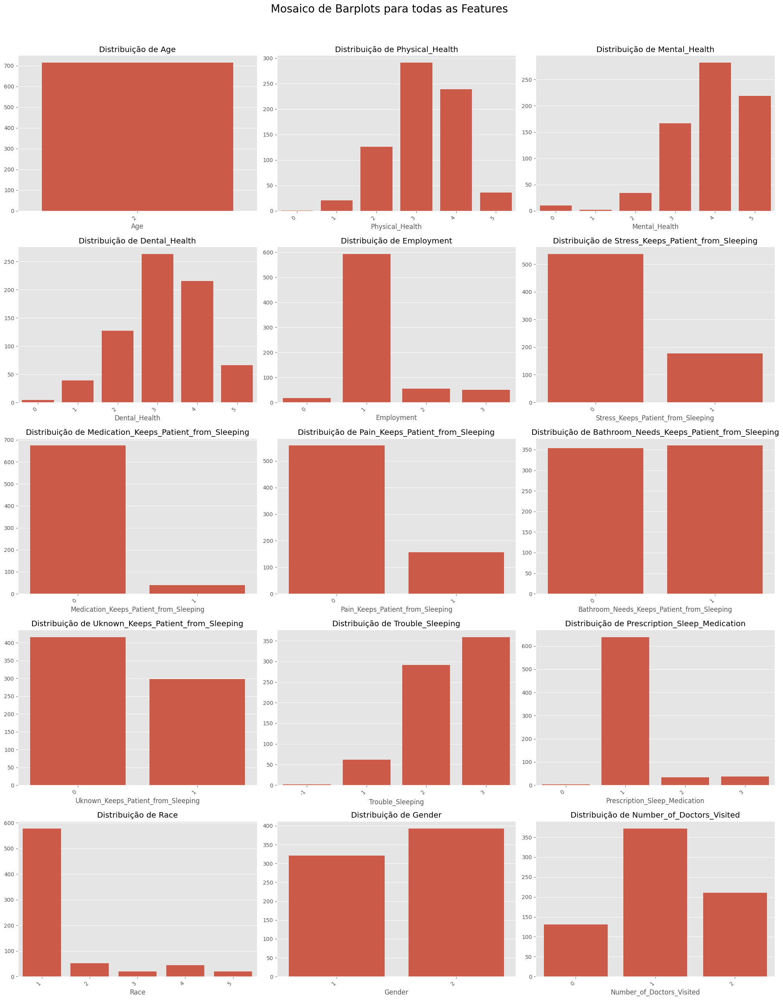

In [38]:
create_barplot_mosaic()

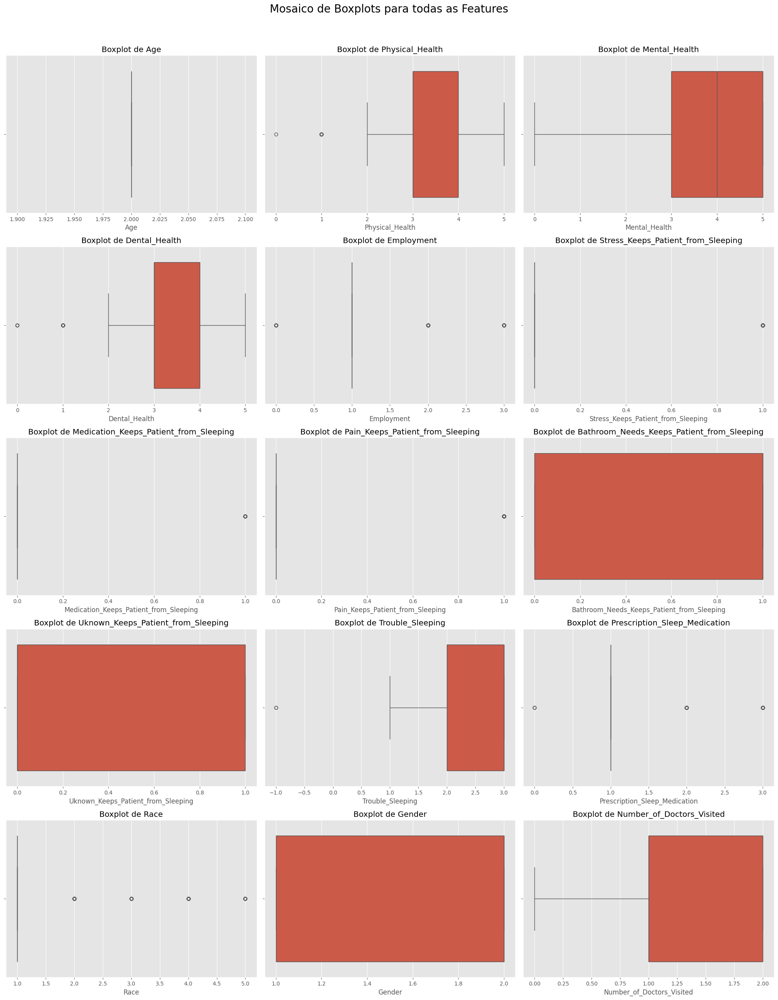

In [39]:
create_boxplot_mosaic()

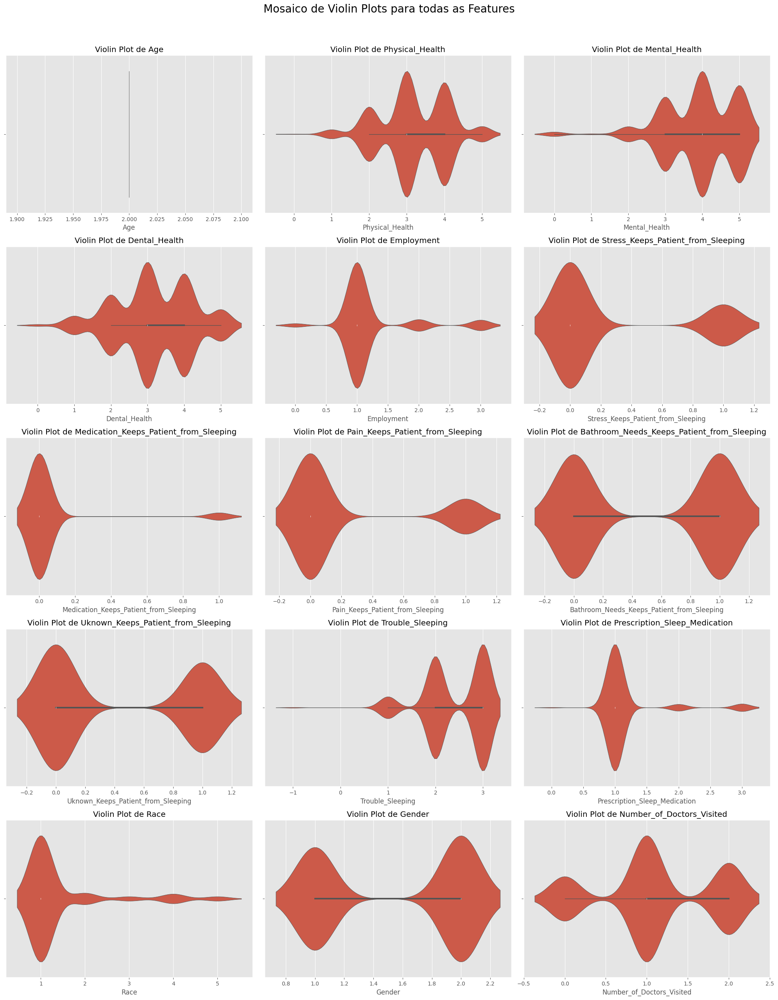

In [40]:
create_violinplot_mosaic()

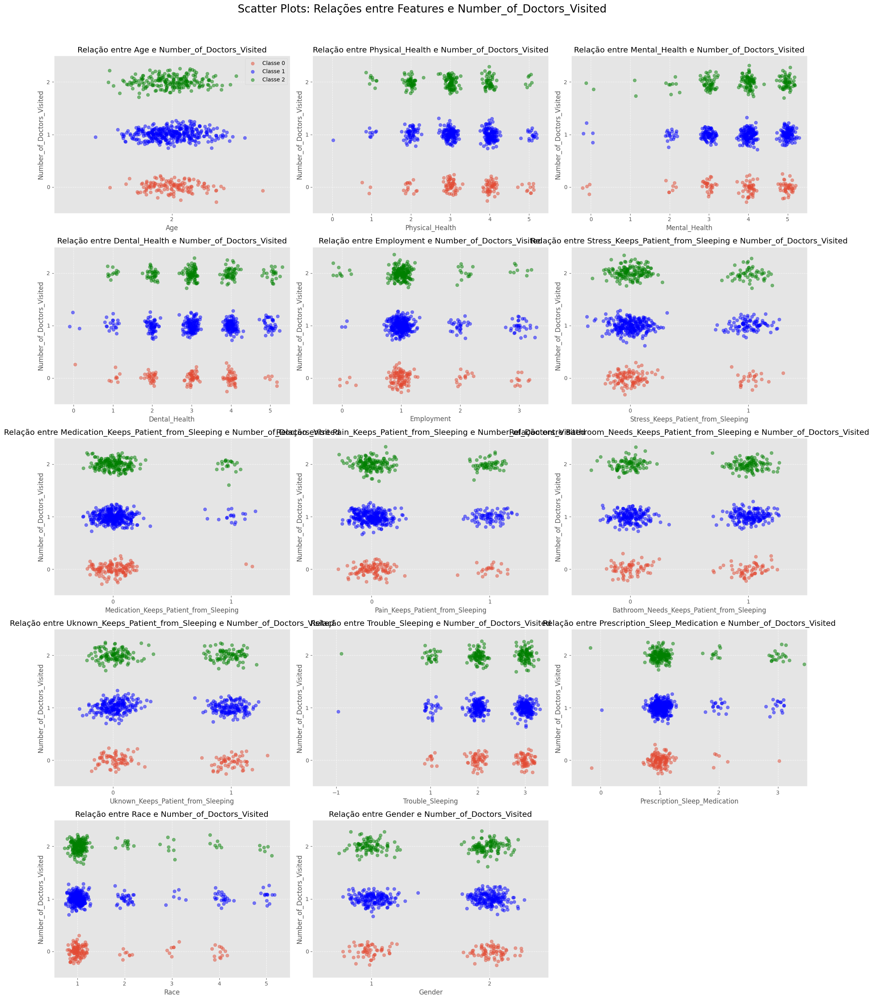

In [41]:
create_scatter_mosaic()

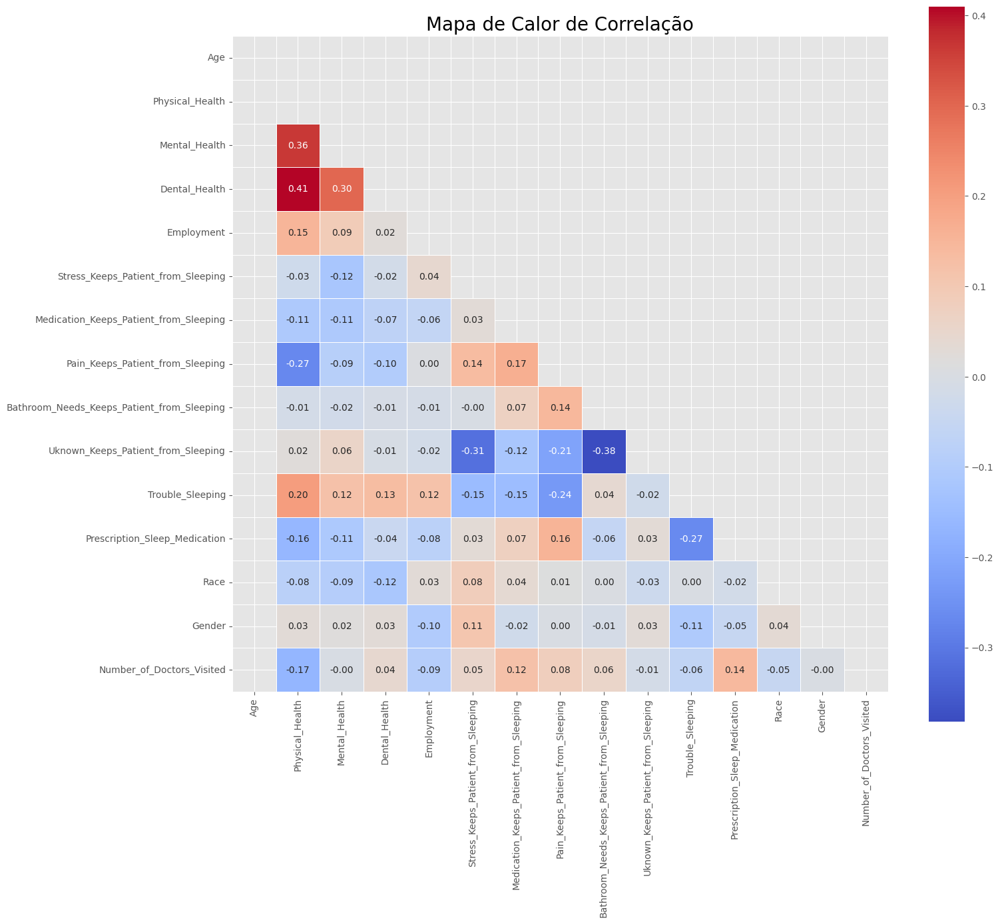

In [42]:
create_correlation_heatmap()

**Conclusão**: Ao analisar as features, tivemos as seguintes conclusões
1. No geral, muitas features do dataset apresentam pouca variabilidade
2. A target não tem uma correlaÇão linear muito forte com nenhuma feature
3. O número de visitas aos médicos não tem correlação com o estado mental dos indivíduos. Isso é inesperado.
4. A coluna de idade e gênero não tem correlação nenhuma com a target e podem ser dropada.
5. Por termos apenas variáveis categóricas e binárias, não teremos necessidade
de normalizar as features
6. O ideal é que usemos o SMOTE na etapa de treinamento devido ao desbalancemanto das features
7. Não temos colunas duplas, então não precisaremos fazer imputação das features, mas precisaremos remover as features duplicadas.
8. Um repameanto dos valores das features foi feito para fazer mais sentido e
precisamos mudar o valor '6' de Dental_Health para o valor da mediana, já que ele não estava presente
na descrição do dataset, indicando um ruído.
9. Trouble sleeping terá que ser dropada pois ela deveria ser binária e apresenta 3 valores (1, 2 e 3). Isso indica forte ruído e não tenho ideias
de como corrigir isso

# 2. Data Cleaning
Visando a Preparar o Conjunto de Dados para a modelagem, nessa etapa:
1. Iremos remover as linhas duplicadas
2. Iremos dividir os dados em 10 conjuntos menores utilizando o StratifiedKfold, além de enriquecermos os dados de treino utilizando SMOTE


In [43]:
df = df.drop_duplicates()

In [44]:
# Preparar X e y
X = df.drop("Number_of_Doctors_Visited", axis=1)
y = df["Number_of_Doctors_Visited"]

# Inicializar StratifiedKFold
skf = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

# Inicializar SMOTE
smote = SMOTE(random_state=42)

# Função auxiliar para calcular proporções
def get_class_proportions(y):
    counts = Counter(y)
    total = len(y)
    return {k: round(v/total, 3) for k, v in counts.items()}

# Lista para armazenar os folds
smote_folds_data = []
original_folds_data = []

# Para cada fold
for i, (train_index, test_index) in enumerate(skf.split(X, y)):
    print(f"\n=== Fold {i+1} ===")
    
    # Obter os subconjuntos originais de treino e teste
    X_temp, X_test = X.iloc[train_index], X.iloc[test_index]
    y_temp, y_test = y.iloc[train_index], y.iloc[test_index]
    
    # Dividir os dados temporários em treino e validação (80% treino, 20% validação)
    X_train, X_val, y_train, y_val = train_test_split(
        X_temp, y_temp, test_size=0.2, random_state=42, stratify=y_temp
    )
    
    # Aplicar SMOTE apenas no conjunto de treino
    X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)
    
    # Converter para DataFrame se X_train_smote retornar um array
    if not isinstance(X_train_smote, pd.DataFrame):
        X_train_smote = pd.DataFrame(X_train_smote, columns=X.columns)
    
    # Mostrar distribuição das classes nos conjuntos originais
    print(f"Distribuição de classes no conjunto de treino: {Counter(y_train)}")
    print(f"Proporção no treino: {get_class_proportions(y_train)}")
    
    print(f"Distribuição de classes no conjunto de validação: {Counter(y_val)}")
    print(f"Proporção na validação: {get_class_proportions(y_val)}")
    
    print(f"Distribuição de classes no conjunto de teste: {Counter(y_test)}")
    print(f"Proporção no teste: {get_class_proportions(y_test)}")
    
    # Distribuição após SMOTE
    print(f"Distribuição no treino após SMOTE: {Counter(y_train_smote)}")
    print(f"Proporção no treino após SMOTE: {get_class_proportions(y_train_smote)}")
    
    # Adicionar os dados à lista
    smote_folds_data.append((X_train_smote, X_val, X_test, y_train_smote, y_val, y_test))
    original_folds_data.append((X_train, X_val, X_test, y_train, y_val, y_test))


=== Fold 1 ===
Distribuição de classes no conjunto de treino: Counter({1: 243, 2: 144, 0: 89})
Proporção no treino: {0: 0.187, 1: 0.511, 2: 0.303}
Distribuição de classes no conjunto de validação: Counter({1: 61, 2: 36, 0: 22})
Proporção na validação: {2: 0.303, 1: 0.513, 0: 0.185}
Distribuição de classes no conjunto de teste: Counter({1: 34, 2: 20, 0: 13})
Proporção no teste: {2: 0.299, 1: 0.507, 0: 0.194}
Distribuição no treino após SMOTE: Counter({0: 243, 1: 243, 2: 243})
Proporção no treino após SMOTE: {0: 0.333, 1: 0.333, 2: 0.333}

=== Fold 2 ===
Distribuição de classes no conjunto de treino: Counter({1: 243, 2: 144, 0: 89})
Proporção no treino: {0: 0.187, 1: 0.511, 2: 0.303}
Distribuição de classes no conjunto de validação: Counter({1: 61, 2: 36, 0: 22})
Proporção na validação: {2: 0.303, 1: 0.513, 0: 0.185}
Distribuição de classes no conjunto de teste: Counter({1: 34, 2: 20, 0: 13})
Proporção no teste: {2: 0.299, 1: 0.507, 0: 0.194}
Distribuição no treino após SMOTE: Counter({

# 3. Feature Engineering


## Modelos

In [45]:
def get_model_dict():
    return {
        "Decision Trees": DecisionTreeClassifier(random_state=42),
        "Gradient Tree Boosting": GradientBoostingClassifier(random_state=42),
        "k-Nearest Neighbors": KNeighborsClassifier(),
        "LightGBM": LGBMClassifier(random_state=42),
        "Multinomial Logistic Regression": LogisticRegression(
            multi_class="multinomial", solver="lbfgs", max_iter=1000, random_state=42
        ),
        "Naive Bayes": GaussianNB(),
        "Random Forests": RandomForestClassifier(random_state=42),
        "Support Vector Machines": SVC(probability=True, random_state=42),
        "XGBoost": XGBClassifier(random_state=42),
        "CatBoost": CatBoostClassifier(verbose=False, random_state=42),
    }

## Algoritmo de Força Bruta

In [46]:
def select_best_features_brute_force(folds_data, classifier, min_features=1, max_features=None, verbose=True):
    """
    Seleciona as melhores features usando abordagem de força bruta.
    
    Parameters:
    -----------
    folds_data : list
        Lista de folds no formato (X_train, X_val, X_test, y_train, y_val, y_test)
    classifier : object
        Classificador que implementa os métodos fit() e predict()
    min_features : int, default=1
        Número mínimo de features a considerar
    max_features : int, default=None
        Número máximo de features a considerar. Se None, usa todas as features.
    verbose : bool, default=True
        Se True, imprime o progresso e os resultados
        
    Returns:
    --------
    best_features : list
        Lista com os nomes das melhores features
    best_avg_score : float
        F1-score médio ponderado obtido com as melhores features
    """
    # Verificar formato dos folds
    if not folds_data or len(folds_data[0]) != 6:
        raise ValueError("Formato de folds incorreto. Esperado: (X_train, X_val, X_test, y_train, y_val, y_test)")
    
    # Extrair os nomes das features do primeiro conjunto de treino
    X_train_sample = folds_data[0][0]
    
    if isinstance(X_train_sample, pd.DataFrame):
        feature_names = X_train_sample.columns.tolist()
    else:
        # Se for um array NumPy, gerar nomes genéricos
        feature_names = [f"feature_{i}" for i in range(X_train_sample.shape[1])]
    
    n_features = len(feature_names)
    
    if max_features is None:
        max_features = n_features
    
    max_features = min(max_features, n_features)
    min_features = max(min_features, 1)
    
    best_avg_score = 0
    best_features = []
    results = {}
    
    # Calcular o total de combinações para mostrar o progresso
    total_combinations = sum(math.comb(n_features, k) for k in range(min_features, max_features + 1))
    
    if verbose:
        print(f"Testando {total_combinations} combinações de features (de {min_features} até {max_features})...")
    
    # Para cada tamanho de combinação
    for k in range(min_features, max_features + 1):
        # Obter todas as combinações de k features
        combos = list(combinations(range(n_features), k))
        
        # Testar cada combinação
        for combo in tqdm(combos, desc=f"Testando combinações com {k} features", disable=not verbose):
            # Índices das features na combinação atual
            feature_indices = list(combo)
            # Nomes das features na combinação atual
            feature_subset = [feature_names[i] for i in feature_indices]
            
            # Lista para armazenar os scores de cada fold
            fold_scores = []
            
            # Avaliar a combinação em cada fold
            for fold_data in folds_data:
                # Desempacotar os dados do fold
                X_train, X_val, X_test, y_train, y_val, y_test = fold_data
                
                # Selecionar apenas as features da combinação atual
                if isinstance(X_train, pd.DataFrame):
                    X_train_subset = X_train[feature_subset]
                    X_val_subset = X_val[feature_subset]
                else:
                    X_train_subset = X_train[:, feature_indices]
                    X_val_subset = X_val[:, feature_indices]
                
                # Clonar o classificador para não alterar o original
                clf = clone(classifier)
                
                # Treinar o modelo
                clf.fit(X_train_subset, y_train)
                
                # Avaliar no conjunto de validação
                y_val_pred = clf.predict(X_val_subset)
                
                # Calcular o f1-score ponderado
                score = f1_score(y_val, y_val_pred, average='weighted')
                fold_scores.append(score)
            
            # Calcular a média dos scores de todos os folds
            avg_score = np.mean(fold_scores)
            
            # Armazenar o resultado
            results[tuple(feature_subset)] = avg_score
            
            # Atualizar o melhor resultado se necessário
            if avg_score > best_avg_score:
                best_avg_score = avg_score
                best_features = feature_subset
                
                if verbose:
                    print(f"\nNova melhor combinação encontrada ({len(best_features)} features):")
                    print(f"Features: {best_features}")
                    print(f"F1-score médio: {best_avg_score:.4f}")
    
    if verbose:
        print("\n" + "="*50)
        print(f"RESULTADO FINAL:")
        print(f"Melhores features ({len(best_features)}):")
        for i, feat in enumerate(best_features, 1):
            print(f"{i}. {feat}")
        print(f"F1-score médio ponderado: {best_avg_score:.4f}")
        print("="*50)
    
    return best_features, best_avg_score

In [47]:
def run_brute_force_feature_selection(original_folds, smote_folds, min_features=1, max_features=5, output_dir='.'):
    """
    Executa a busca por força bruta para cada classificador do dicionário, com e sem SMOTE.
    Salva os resultados em um arquivo de texto formatado.
    
    Parameters:
    -----------
    original_folds : list
        Lista de folds originais (sem SMOTE)
    smote_folds : list
        Lista de folds com SMOTE aplicado
    min_features : int, default=1
        Número mínimo de features a considerar
    max_features : int, default=5
        Número máximo de features a considerar
    output_dir : str, default='.'
        Diretório onde será salvo o arquivo de resultados
    
    Returns:
    --------
    dict
        Dicionário com os resultados da busca por força bruta
    """
    # Obter os modelos
    models = get_model_dict()
    
    # Dicionário para armazenar os resultados
    results = {
        'original': {},
        'smote': {}
    }
    
    # Criar nome de arquivo com timestamp para garantir unicidade
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    filename = f"feature_selection_results_{timestamp}.txt"
    filepath = os.path.join(output_dir, filename)
    
    # Abrir arquivo para escrita
    with open(filepath, 'w') as f:
        # Escrever cabeçalho
        f.write("="*80 + "\n")
        f.write(f"RESULTADOS DA SELEÇÃO DE FEATURES POR FORÇA BRUTA\n")
        f.write(f"Data e hora: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}\n")
        f.write(f"Parâmetros: min_features={min_features}, max_features={max_features}\n")
        f.write("="*80 + "\n\n")
        
        # Executar busca para cada tipo de fold (original e SMOTE)
        for fold_type, folds in [("ORIGINAL (sem SMOTE)", original_folds), ("SMOTE", smote_folds)]:
            f.write(f"TIPO DE DADOS: {fold_type}\n")
            f.write("="*80 + "\n\n")
            
            # Chave para o dicionário de resultados
            dict_key = 'original' if fold_type.startswith("ORIGINAL") else 'smote'
            
            # Executar para cada modelo
            for model_name, model in tqdm(models.items(), desc=f"Processando modelos ({fold_type})"):
                start_time = time.time()
                
                f.write(f"MODELO: {model_name}\n")
                f.write("-"*80 + "\n")
                
                # Executar a busca por força bruta
                try:
                    best_features, best_score = select_best_features_brute_force(
                        folds, 
                        model, 
                        min_features=min_features,
                        max_features=max_features,
                        verbose=False
                    )
                    
                    # Armazenar resultados no dicionário
                    results[dict_key][model_name] = {
                        'features': best_features,
                        'score': best_score
                    }
                    
                    # Escrever resultados no arquivo
                    f.write(f"F1-score médio: {best_score:.4f}\n")
                    f.write(f"Número de features: {len(best_features)}\n")
                    f.write("Features:\n")
                    for i, feature in enumerate(best_features, 1):
                        f.write(f"  {i}. {feature}\n")
                    
                    end_time = time.time()
                    duration = end_time - start_time
                    f.write(f"Tempo de execução: {duration:.2f} segundos\n")
                    
                except Exception as e:
                    # Em caso de erro, registrar no arquivo e no dicionário
                    error_msg = f"ERRO: {str(e)}"
                    f.write(error_msg + "\n")
                    results[dict_key][model_name] = {
                        'error': error_msg
                    }
                
                f.write("\n")
            
            # Identificar o melhor modelo para este tipo de fold
            best_model = None
            best_score = 0
            
            for model_name, model_results in results[dict_key].items():
                if 'score' in model_results and model_results['score'] > best_score:
                    best_score = model_results['score']
                    best_model = model_name
            
            if best_model:
                f.write("="*80 + "\n")
                f.write(f"MELHOR MODELO PARA {fold_type}: {best_model}\n")
                f.write(f"F1-score: {best_score:.4f}\n")
                f.write(f"Features ({len(results[dict_key][best_model]['features'])}):\n")
                for i, feature in enumerate(results[dict_key][best_model]['features'], 1):
                    f.write(f"  {i}. {feature}\n")
                f.write("="*80 + "\n\n")
    
    print(f"Resultados salvos em: {filepath}")
    return results, filepath

### Chamada do Algoritmo

In [48]:
# results = run_comprehensive_feature_selection(original_folds_data, smote_folds_data, min_features=2, max_features=14)

## Algortimo de Seleção por Treshold de Variância

In [49]:
def run_variance_feature_selection(original_folds, smote_folds, thresholds=[0.0, 0.01, 0.05, 0.1, 0.15, 0.2], output_dir='.'):
    """
    Executa a seleção de features por variância para cada classificador, com e sem SMOTE.
    Salva os resultados em um arquivo de texto formatado.
    
    Parameters:
    -----------
    original_folds : list
        Lista de folds originais (sem SMOTE)
    smote_folds : list
        Lista de folds com SMOTE aplicado
    thresholds : list, default=[0.0, 0.01, 0.05, 0.1, 0.15, 0.2]
        Lista de limiares de variância para testar
    output_dir : str, default='.'
        Diretório onde será salvo o arquivo de resultados
    
    Returns:
    --------
    dict
        Dicionário com os resultados da seleção por variância
    str
        Caminho do arquivo de resultados
    """
    # Obter os modelos
    models = get_model_dict()
    
    # Dicionário para armazenar os resultados
    results = {
        'original': {},
        'smote': {}
    }
    
    # Criar nome de arquivo com timestamp para garantir unicidade
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    filename = f"variance_selection_results_{timestamp}.txt"
    filepath = os.path.join(output_dir, filename)
    
    # Abrir arquivo para escrita
    with open(filepath, 'w') as f:
        # Escrever cabeçalho
        f.write("="*80 + "\n")
        f.write(f"RESULTADOS DA SELEÇÃO DE FEATURES POR VARIÂNCIA\n")
        f.write(f"Data e hora: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}\n")
        f.write(f"Limiares testados: {thresholds}\n")
        f.write("="*80 + "\n\n")
        
        # Executar para cada tipo de fold (original e SMOTE)
        for fold_type, folds in [("ORIGINAL (sem SMOTE)", original_folds), ("SMOTE", smote_folds)]:
            f.write(f"TIPO DE DADOS: {fold_type}\n")
            f.write("="*80 + "\n\n")
            
            # Chave para o dicionário de resultados
            dict_key = 'original' if fold_type.startswith("ORIGINAL") else 'smote'
            
            # Inicializar dicionário para este tipo de fold
            results[dict_key] = {}
            
            # Extrair os nomes das features do primeiro conjunto de treino
            X_train_sample = folds[0][0]
            
            if isinstance(X_train_sample, pd.DataFrame):
                all_feature_names = X_train_sample.columns.tolist()
            else:
                # Se for um array NumPy, gerar nomes genéricos
                all_feature_names = [f"feature_{i}" for i in range(X_train_sample.shape[1])]
            
            # Executar para cada modelo
            for model_name, model in tqdm(models.items(), desc=f"Processando modelos ({fold_type})"):
                start_time = time.time()
                
                f.write(f"MODELO: {model_name}\n")
                f.write("-"*80 + "\n")
                
                # Dicionário para armazenar resultados deste modelo
                model_results = {
                    'threshold_results': {},
                    'best_threshold': None,
                    'best_features': [],
                    'best_score': 0.0
                }
                
                try:
                    # Testar cada limiar
                    for threshold in thresholds:
                        # Lista para armazenar scores de cada fold
                        fold_scores = []
                        # Lista para armazenar as features selecionadas em cada fold
                        selected_features_per_fold = []
                        
                        # Avaliar cada fold
                        for fold_data in folds:
                            # Desempacotar os dados do fold
                            X_train, X_val, X_test, y_train, y_val, y_test = fold_data
                            
                            # Criar o seletor de variância
                            selector = VarianceThreshold(threshold=threshold)
                            
                            # Ajustar e transformar os dados de treino
                            if isinstance(X_train, pd.DataFrame):
                                # Ajustar o seletor
                                selector.fit(X_train)
                                
                                # Obter as features selecionadas
                                selected_feature_mask = selector.get_support()
                                selected_features = [all_feature_names[i] for i, selected in enumerate(selected_feature_mask) if selected]
                                
                                # Aplicar a seleção
                                X_train_selected = X_train[selected_features]
                                X_val_selected = X_val[selected_features]
                            else:
                                # Se for NumPy array
                                selector.fit(X_train)
                                
                                # Obter as features selecionadas
                                selected_feature_mask = selector.get_support()
                                selected_features = [all_feature_names[i] for i, selected in enumerate(selected_feature_mask) if selected]
                                
                                # Aplicar a seleção
                                X_train_selected = selector.transform(X_train)
                                X_val_selected = selector.transform(X_val)
                            
                            # Guardar as features selecionadas neste fold
                            selected_features_per_fold.append(selected_features)
                            
                            # Verificar se há features suficientes
                            if len(selected_features) == 0:
                                fold_scores.append(0)  # Pontuação zero se todas as features forem removidas
                                continue
                            
                            # Treinar o classificador
                            clf = clone(model)
                            clf.fit(X_train_selected, y_train)
                            
                            # Avaliar no conjunto de validação
                            y_val_pred = clf.predict(X_val_selected)
                            
                            # Calcular o f1-score ponderado
                            score = f1_score(y_val, y_val_pred, average='weighted')
                            fold_scores.append(score)
                        
                        # Calcular a média dos scores de todos os folds
                        avg_score = np.mean(fold_scores)
                        
                        # Encontrar as features que são comuns a todos os folds
                        if selected_features_per_fold:
                            # Inicializa com as features do primeiro fold
                            common_features = set(selected_features_per_fold[0])
                            
                            # Intersecção com as features dos outros folds
                            for features in selected_features_per_fold[1:]:
                                common_features = common_features.intersection(set(features))
                            
                            common_features = list(common_features)
                        else:
                            common_features = []
                        
                        # Armazenar o resultado para este limiar
                        model_results['threshold_results'][threshold] = {
                            'score': avg_score,
                            'features': common_features,
                            'num_features': len(common_features)
                        }
                        
                        # Atualizar o melhor resultado se necessário
                        if avg_score > model_results['best_score']:
                            model_results['best_score'] = avg_score
                            model_results['best_features'] = common_features
                            model_results['best_threshold'] = threshold
                    
                    # Escrever resultados no arquivo
                    f.write(f"Melhor limiar: {model_results['best_threshold']}\n")
                    f.write(f"F1-score médio: {model_results['best_score']:.4f}\n")
                    f.write(f"Número de features: {len(model_results['best_features'])}\n")
                    f.write("Features:\n")
                    for i, feature in enumerate(model_results['best_features'], 1):
                        f.write(f"  {i}. {feature}\n")
                    
                    # Armazenar resultados no dicionário principal
                    results[dict_key][model_name] = model_results
                    
                    end_time = time.time()
                    duration = end_time - start_time
                    f.write(f"Tempo de execução: {duration:.2f} segundos\n")
                    
                except Exception as e:
                    # Em caso de erro, registrar no arquivo e no dicionário
                    error_msg = f"ERRO: {str(e)}"
                    f.write(error_msg + "\n")
                    results[dict_key][model_name] = {'error': error_msg}
                
                f.write("\n")
            
            # Identificar o melhor modelo para este tipo de fold
            best_model = None
            best_score = 0
            
            for model_name, model_results in results[dict_key].items():
                if isinstance(model_results, dict) and 'best_score' in model_results and model_results['best_score'] > best_score:
                    best_score = model_results['best_score']
                    best_model = model_name
            
            if best_model:
                f.write("="*80 + "\n")
                f.write(f"MELHOR MODELO PARA {fold_type}: {best_model}\n")
                f.write(f"Limiar: {results[dict_key][best_model]['best_threshold']}\n")
                f.write(f"F1-score: {best_score:.4f}\n")
                f.write(f"Features ({len(results[dict_key][best_model]['best_features'])}):\n")
                for i, feature in enumerate(results[dict_key][best_model]['best_features'], 1):
                    f.write(f"  {i}. {feature}\n")
                f.write("="*80 + "\n\n")
            
            # Tabela comparativa dos resultados
            f.write("\nTABELA COMPARATIVA DOS MODELOS:\n")
            f.write("-"*80 + "\n")
            f.write(f"{'Modelo':<30} | {'Limiar':<10} | {'Features':<10} | {'F1-Score':<10}\n")
            f.write("-"*80 + "\n")
            
            for model_name, model_results in results[dict_key].items():
                if isinstance(model_results, dict) and 'best_score' in model_results:
                    f.write(f"{model_name:<30} | {model_results['best_threshold']:<10.3f} | {len(model_results['best_features']):<10} | {model_results['best_score']:<10.4f}\n")
                else:
                    f.write(f"{model_name:<30} | {'ERRO':<10} | {'ERRO':<10} | {'ERRO':<10}\n")
            
            f.write("-"*80 + "\n\n")
    
    print(f"Resultados da seleção por variância salvos em: {filepath}")
    return results, filepath

### Execução

In [50]:
# Define os limiares a serem testados
thresholds = [0.33, 0.50, 0.75]

# Executa a seleção por variância
variance_results, variance_filepath = run_variance_feature_selection(
    original_folds_data,
    smote_folds_data,
    thresholds=thresholds
)

print(f"O arquivo de resultados foi salvo em: {variance_filepath}")

Processando modelos (ORIGINAL (sem SMOTE)):  30%|███       | 3/10 [00:14<00:33,  4.83s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000096 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 32
[LightGBM] [Info] Number of data points in the train set: 476, number of used features: 6
[LightGBM] [Info] Start training from score -1.676781
[LightGBM] [Info] Start training from score -0.672356
[LightGBM] [Info] Start training from score -1.195605
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

Processando modelos (ORIGINAL (sem SMOTE)):  40%|████      | 4/10 [00:17<00:23,  3.99s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/home/tnpb/.local/share/virtualenv

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000082 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 32
[LightGBM] [Info] Number of data points in the train set: 729, number of used features: 6
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

Processando modelos (SMOTE):  40%|████      | 4/10 [00:19<00:26,  4.48s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/home/tnpb/.local/share/virtualenv

Resultados da seleção por variância salvos em: ./variance_selection_results_20250321_172344.txt
O arquivo de resultados foi salvo em: ./variance_selection_results_20250321_172344.txt


## Algoritmo Anova (f-classif)

In [51]:
def run_f_classif_feature_selection(original_folds, smote_folds, k_values=None, output_dir='.'):
    """
    Executa a seleção de features usando SelectKBest com f_classif para cada classificador, com e sem SMOTE.
    Salva os resultados em um arquivo de texto formatado.
    
    Parameters:
    -----------
    original_folds : list
        Lista de folds originais (sem SMOTE)
    smote_folds : list
        Lista de folds com SMOTE aplicado
    k_values : list, default=None
        Lista de valores k (número de features) para testar. Se None, usa valores baseados no dataset.
    output_dir : str, default='.'
        Diretório onde será salvo o arquivo de resultados
    
    Returns:
    --------
    dict
        Dicionário com os resultados da seleção por f_classif
    str
        Caminho do arquivo de resultados
    """
    # Obter os modelos
    models = get_model_dict()
    
    # Dicionário para armazenar os resultados
    results = {
        'original': {},
        'smote': {}
    }
    
    # Criar nome de arquivo com timestamp para garantir unicidade
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    filename = f"f_classif_selection_results_{timestamp}.txt"
    filepath = os.path.join(output_dir, filename)
    
    # Extrair os nomes das features do primeiro conjunto de treino para definir os valores de k, se necessário
    X_train_sample = original_folds[0][0]
    
    if isinstance(X_train_sample, pd.DataFrame):
        all_feature_names = X_train_sample.columns.tolist()
    else:
        # Se for um array NumPy, gerar nomes genéricos
        all_feature_names = [f"feature_{i}" for i in range(X_train_sample.shape[1])]
    
    # Definir valores de k se não fornecidos
    if k_values is None:
        n_features = len(all_feature_names)
        # Testar aproximadamente 5 valores de k ou todos se houver menos de 5 features
        k_values = sorted(set([1, 2, 3, max(1, n_features // 2), n_features]))
        # Limitar a features existentes
        k_values = [k for k in k_values if k <= n_features]
    
    # Abrir arquivo para escrita
    with open(filepath, 'w') as f:
        # Escrever cabeçalho
        f.write("="*80 + "\n")
        f.write(f"RESULTADOS DA SELEÇÃO DE FEATURES COM SelectKBest (f_classif)\n")
        f.write(f"Data e hora: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}\n")
        f.write(f"Valores de k testados: {k_values}\n")
        f.write("="*80 + "\n\n")
        
        # Executar para cada tipo de fold (original e SMOTE)
        for fold_type, folds in [("ORIGINAL (sem SMOTE)", original_folds), ("SMOTE", smote_folds)]:
            f.write(f"TIPO DE DADOS: {fold_type}\n")
            f.write("="*80 + "\n\n")
            
            # Chave para o dicionário de resultados
            dict_key = 'original' if fold_type.startswith("ORIGINAL") else 'smote'
            
            # Inicializar dicionário para este tipo de fold
            results[dict_key] = {}
            
            # Executar para cada modelo
            for model_name, model in tqdm(models.items(), desc=f"Processando modelos ({fold_type})"):
                start_time = time.time()
                
                f.write(f"MODELO: {model_name}\n")
                f.write("-"*80 + "\n")
                
                # Dicionário para armazenar resultados deste modelo
                model_results = {
                    'k_results': {},
                    'best_k': None,
                    'best_features': [],
                    'best_score': 0.0
                }
                
                try:
                    # Testar cada valor de k
                    for k in k_values:
                        # Lista para armazenar scores de cada fold
                        fold_scores = []
                        # Lista para armazenar as features selecionadas em cada fold
                        selected_features_per_fold = []
                        
                        # Avaliar cada fold
                        for fold_data in folds:
                            # Desempacotar os dados do fold
                            X_train, X_val, _, y_train, y_val, _ = fold_data
                            
                            # Criar o seletor com f_classif
                            selector = SelectKBest(f_classif, k=k)
                            
                            # Ajustar e transformar os dados de treino
                            if isinstance(X_train, pd.DataFrame):
                                # Ajustar o seletor
                                selector.fit(X_train, y_train)
                                
                                # Obter as features selecionadas
                                selected_feature_mask = selector.get_support()
                                selected_features = [all_feature_names[i] for i, selected in enumerate(selected_feature_mask) if selected]
                                
                                # Aplicar a seleção
                                X_train_selected = X_train[selected_features]
                                X_val_selected = X_val[selected_features]
                            else:
                                # Se for NumPy array
                                selector.fit(X_train, y_train)
                                
                                # Obter as features selecionadas
                                selected_feature_mask = selector.get_support()
                                selected_features = [all_feature_names[i] for i, selected in enumerate(selected_feature_mask) if selected]
                                
                                # Aplicar a seleção
                                X_train_selected = selector.transform(X_train)
                                X_val_selected = selector.transform(X_val)
                            
                            # Guardar as features selecionadas neste fold
                            selected_features_per_fold.append(selected_features)
                            
                            # Verificar se há features suficientes
                            if len(selected_features) == 0:
                                fold_scores.append(0)  # Pontuação zero se todas as features forem removidas
                                continue
                            
                            # Treinar o classificador
                            clf = clone(model)
                            try:
                                clf.fit(X_train_selected, y_train)
                                
                                # Avaliar no conjunto de validação
                                y_val_pred = clf.predict(X_val_selected)
                                
                                # Calcular o f1-score ponderado
                                score = f1_score(y_val, y_val_pred, average='weighted')
                                fold_scores.append(score)
                            except Exception as e:
                                print(f"Erro ao treinar modelo {model_name} com k={k}: {str(e)}")
                                fold_scores.append(0)
                        
                        # Calcular a média dos scores de todos os folds
                        avg_score = np.mean(fold_scores)
                        
                        # Encontrar as features mais comuns entre todos os folds
                        feature_counter = {}
                        for features in selected_features_per_fold:
                            for feature in features:
                                if feature in feature_counter:
                                    feature_counter[feature] += 1
                                else:
                                    feature_counter[feature] = 1
                        
                        # Selecionar as k features mais comuns
                        most_common_features = sorted(feature_counter.items(), key=lambda x: x[1], reverse=True)[:k]
                        common_features = [feat for feat, count in most_common_features if count > 0]
                        
                        # Armazenar o resultado para este valor de k
                        model_results['k_results'][k] = {
                            'score': avg_score,
                            'features': common_features,
                            'num_features': len(common_features)
                        }
                        
                        # Atualizar o melhor resultado se necessário
                        if avg_score > model_results['best_score']:
                            model_results['best_score'] = avg_score
                            model_results['best_features'] = common_features
                            model_results['best_k'] = k
                    
                    # Escrever resultados no arquivo
                    f.write(f"Melhor valor de k: {model_results['best_k']}\n")
                    f.write(f"F1-score médio: {model_results['best_score']:.4f}\n")
                    f.write(f"Número de features: {len(model_results['best_features'])}\n")
                    f.write("Features:\n")
                    for i, feature in enumerate(model_results['best_features'], 1):
                        f.write(f"  {i}. {feature}\n")
                    
                    # Armazenar resultados no dicionário principal
                    results[dict_key][model_name] = model_results
                    
                    end_time = time.time()
                    duration = end_time - start_time
                    f.write(f"Tempo de execução: {duration:.2f} segundos\n")
                    
                except Exception as e:
                    # Em caso de erro, registrar no arquivo e no dicionário
                    error_msg = f"ERRO: {str(e)}"
                    f.write(error_msg + "\n")
                    results[dict_key][model_name] = {'error': error_msg}
                
                f.write("\n")
            
            # Identificar o melhor modelo para este tipo de fold
            best_model = None
            best_score = 0
            
            for model_name, model_results in results[dict_key].items():
                if isinstance(model_results, dict) and 'best_score' in model_results and model_results['best_score'] > best_score:
                    best_score = model_results['best_score']
                    best_model = model_name
            
            if best_model:
                f.write("="*80 + "\n")
                f.write(f"MELHOR MODELO PARA {fold_type}: {best_model}\n")
                f.write(f"Valor de k: {results[dict_key][best_model]['best_k']}\n")
                f.write(f"F1-score: {best_score:.4f}\n")
                f.write(f"Features ({len(results[dict_key][best_model]['best_features'])}):\n")
                for i, feature in enumerate(results[dict_key][best_model]['best_features'], 1):
                    f.write(f"  {i}. {feature}\n")
                f.write("="*80 + "\n\n")
            
            # Tabela comparativa dos resultados
            f.write("\nTABELA COMPARATIVA DOS MODELOS:\n")
            f.write("-"*80 + "\n")
            f.write(f"{'Modelo':<30} | {'Valor k':<10} | {'Features':<10} | {'F1-Score':<10}\n")
            f.write("-"*80 + "\n")
            
            for model_name, model_results in results[dict_key].items():
                if isinstance(model_results, dict) and 'best_score' in model_results:
                    f.write(f"{model_name:<30} | {model_results['best_k']:<10} | {len(model_results['best_features']):<10} | {model_results['best_score']:<10.4f}\n")
                else:
                    f.write(f"{model_name:<30} | {'ERRO':<10} | {'ERRO':<10} | {'ERRO':<10}\n")
            
            f.write("-"*80 + "\n\n")
    
    print(f"Resultados da seleção com f_classif salvos em: {filepath}")
    return results, filepath

### Execução

In [52]:
anova_results, anova_filepath = run_f_classif_feature_selection(original_folds_data, smote_folds_data, [i for i in range(6, 15)])

Processando modelos (ORIGINAL (sem SMOTE)):   0%|          | 0/10 [00:00<?, ?it/s]/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000097 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24
[LightGBM] [Info] Number of data points in the train set: 476, number of used features: 6
[LightGBM] [Info] Start training from score -1.676781
[LightGBM] [Info] Start training from score -0.672356
[LightGBM] [Info] Start training from score -1.195605
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/fea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/fea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/fea

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000092 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 29
[LightGBM] [Info] Number of data points in the train set: 476, number of used features: 7
[LightGBM] [Info] Start training from score -1.676781
[LightGBM] [Info] Start training from score -0.672356
[LightGBM] [Info] Start training from score -1.195605
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/fea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/fea

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000097 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 31
[LightGBM] [Info] Number of data points in the train set: 476, number of used features: 8
[LightGBM] [Info] Start training from score -1.676781
[LightGBM] [Info] Start training from score -0.672356
[LightGBM] [Info] Start training from score -1.195605
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/fea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/fea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/fea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000113 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 39
[LightGBM] [Info] Number of data points in the train set: 476, number of used features: 10
[LightGBM] [Info] Start training from score -1.676781
[LightGBM] [Info] Start training from score -0.672356
[LightGBM] [Info] Start training from score -1.195605
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000122 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 42
[LightGBM] [Info] Number of data points in the train set: 476, number of used features: 11
[LightGBM] [Info] Start training from score -1.676781
[LightGBM] [Info] Start training from score -0.672356
[LightGBM] [Info] Start training from score -1.195605
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000106 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 42
[LightGBM] [Info] Number of data points in the train set: 476, number of used features: 11
[LightGBM] [Info] Start training from score -1.676781
[LightGBM] [Info] Start training from score -0.672356
[LightGBM] [Info] Start training from score -1.195605
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000121 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 41
[LightGBM] [Info] Number of data points in the train set: 476, number of used features: 11
[LightGBM] [Info] Start training from score -1.676781
[LightGBM] [Info] Start training from score -0.672356
[LightGBM] [Info] Start training from score -1.195605
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000146 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 47
[LightGBM] [Info] Number of data points in the train set: 476, number of used features: 12
[LightGBM] [Info] Start training from score -1.676781
[LightGBM] [Info] Start training from score -0.672356
[LightGBM] [Info] Start training from score -1.195605
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000114 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 47
[LightGBM] [Info] Number of data points in the train set: 476, number of used features: 12
[LightGBM] [Info] Start training from score -1.676781
[LightGBM] [Info] Start training from score -0.672356
[LightGBM] [Info] Start training from score -1.195605
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000114 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 46
[LightGBM] [Info] Number of data points in the train set: 476, number of used features: 12
[LightGBM] [Info] Start training from score -1.676781
[LightGBM] [Info] Start training from score -0.672356
[LightGBM] [Info] Start training from score -1.195605
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000126 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 49
[LightGBM] [Info] Number of data points in the train set: 476, number of used features: 13
[LightGBM] [Info] Start training from score -1.676781
[LightGBM] [Info] Start training from score -0.672356
[LightGBM] [Info] Start training from score -1.195605
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/fea

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000137 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 49
[LightGBM] [Info] Number of data points in the train set: 476, number of used features: 13
[LightGBM] [Info] Start training from score -1.676781
[LightGBM] [Info] Start training from score -0.672356
[LightGBM] [Info] Start training from score -1.195605
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000119 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 49
[LightGBM] [Info] Number of data points in the train set: 476, number of used features: 13
[LightGBM] [Info] Start training from score -1.676781
[LightGBM] [Info] Start training from score -0.672356
[LightGBM] [Info] Start training from score -1.195605
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
Processando modelos (ORIGINAL (sem SMOTE)):  40%|████      | 4/10 [00:58<01:20, 13.47s/i

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000113 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 49
[LightGBM] [Info] Number of data points in the train set: 476, number of used features: 13
[LightGBM] [Info] Start training from score -1.676781
[LightGBM] [Info] Start training from score -0.672356
[LightGBM] [Info] Start training from score -1.195605
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % con

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000115 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 20
[LightGBM] [Info] Number of data points in the train set: 729, number of used features: 6
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000106 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24
[LightGBM] [Info] Number of data points in the train set: 729, number of used features: 6
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000128 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 26
[LightGBM] [Info] Number of data points in the train set: 729, number of used features: 7
[LightGBM] [Info] Start training from score -1.09861

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000188 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 26
[LightGBM] [Info] Number of data points in the train set: 729, number of used features: 7
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000756 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 31
[LightGBM] [Info] Number of data points in the train set: 729, number of used features: 8
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000119 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 37
[LightGBM] [Info] Number of data points in the train set: 729, number of used features: 9
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000126 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 48
[LightGBM] [Info] Number of data points in the train set: 729, number of used features: 12
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000150 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 50
[LightGBM] [Info] Number of data points in the train set: 729, number of used features: 13
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
Processando modelos (SMOTE):  40%|████      | 4/10 [01:03<01:32, 15.45s/it]/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: RuntimeWarning: invalid value encountered in divide
  f = msb / msw
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:111: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % con

Resultados da seleção com f_classif salvos em: ./f_classif_selection_results_20250321_172542.txt


## Algoritmo Chi2

In [53]:
def run_chi2_feature_selection(original_folds, smote_folds, k_values=None, output_dir='.'):
    """
    Executa a seleção de features usando SelectKBest com chi2 para cada classificador, com e sem SMOTE.
    Salva os resultados em um arquivo de texto formatado.
    
    Parameters:
    -----------
    original_folds : list
        Lista de folds originais (sem SMOTE)
    smote_folds : list
        Lista de folds com SMOTE aplicado
    k_values : list, default=None
        Lista de valores k (número de features) para testar. Se None, usa valores baseados no dataset.
    output_dir : str, default='.'
        Diretório onde será salvo o arquivo de resultados
    
    Returns:
    --------
    dict
        Dicionário com os resultados da seleção por chi2
    str
        Caminho do arquivo de resultados
    """
    # Obter os modelos
    models = get_model_dict()
    
    # Dicionário para armazenar os resultados
    results = {
        'original': {},
        'smote': {}
    }
    
    # Criar nome de arquivo com timestamp para garantir unicidade
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    filename = f"chi2_selection_results_{timestamp}.txt"
    filepath = os.path.join(output_dir, filename)
    
    # Extrair os nomes das features do primeiro conjunto de treino para definir os valores de k, se necessário
    X_train_sample = original_folds[0][0]
    
    if isinstance(X_train_sample, pd.DataFrame):
        all_feature_names = X_train_sample.columns.tolist()
    else:
        # Se for um array NumPy, gerar nomes genéricos
        all_feature_names = [f"feature_{i}" for i in range(X_train_sample.shape[1])]
    
    # Definir valores de k se não fornecidos
    if k_values is None:
        n_features = len(all_feature_names)
        # Testar aproximadamente 5 valores de k ou todos se houver menos de 5 features
        k_values = sorted(set([1, 2, 3, max(1, n_features // 2), n_features]))
        # Limitar a features existentes
        k_values = [k for k in k_values if k <= n_features]
    
    # Abrir arquivo para escrita
    with open(filepath, 'w') as f:
        # Escrever cabeçalho
        f.write("="*80 + "\n")
        f.write(f"RESULTADOS DA SELEÇÃO DE FEATURES COM SelectKBest (chi2)\n")
        f.write(f"Data e hora: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}\n")
        f.write(f"Valores de k testados: {k_values}\n")
        f.write("="*80 + "\n\n")
        f.write("NOTA: chi2 requer dados não-negativos. Os dados serão verificados e qualquer valor negativo será tratado.\n\n")
        
        # Executar para cada tipo de fold (original e SMOTE)
        for fold_type, folds in [("ORIGINAL (sem SMOTE)", original_folds), ("SMOTE", smote_folds)]:
            f.write(f"TIPO DE DADOS: {fold_type}\n")
            f.write("="*80 + "\n\n")
            
            # Chave para o dicionário de resultados
            dict_key = 'original' if fold_type.startswith("ORIGINAL") else 'smote'
            
            # Inicializar dicionário para este tipo de fold
            results[dict_key] = {}
            
            # Verificar se os dados têm valores negativos
            has_negative = False
            for fold_data in folds:
                X_train = fold_data[0]
                if isinstance(X_train, pd.DataFrame):
                    if (X_train.values < 0).any():
                        has_negative = True
                        break
                else:
                    if (X_train < 0).any():
                        has_negative = True
                        break
            
            if has_negative:
                f.write("AVISO: Foram detectados valores negativos nos dados. Eles serão convertidos para 0 para compatibilidade com chi2.\n\n")
            
            # Executar para cada modelo
            for model_name, model in tqdm(models.items(), desc=f"Processando modelos ({fold_type})"):
                start_time = time.time()
                
                f.write(f"MODELO: {model_name}\n")
                f.write("-"*80 + "\n")
                
                # Dicionário para armazenar resultados deste modelo
                model_results = {
                    'k_results': {},
                    'best_k': None,
                    'best_features': [],
                    'best_score': 0.0
                }
                
                try:
                    # Testar cada valor de k
                    for k in k_values:
                        # Lista para armazenar scores de cada fold
                        fold_scores = []
                        # Lista para armazenar as features selecionadas em cada fold
                        selected_features_per_fold = []
                        
                        # Avaliar cada fold
                        for fold_data in folds:
                            # Desempacotar os dados do fold
                            X_train, X_val, _, y_train, y_val, _ = fold_data
                            
                            # Preparar dados para chi2 (remover valores negativos)
                            if isinstance(X_train, pd.DataFrame):
                                # Criar cópias para não modificar os originais
                                X_train_chi2 = X_train.copy()
                                X_val_chi2 = X_val.copy()
                                
                                # Converter valores negativos para 0
                                X_train_chi2[X_train_chi2 < 0] = 0
                                X_val_chi2[X_val_chi2 < 0] = 0
                            else:
                                # Para arrays NumPy
                                X_train_chi2 = np.maximum(X_train, 0)
                                X_val_chi2 = np.maximum(X_val, 0)
                            
                            # Criar o seletor com chi2
                            selector = SelectKBest(chi2, k=k)
                            
                            # Ajustar e transformar os dados de treino
                            if isinstance(X_train, pd.DataFrame):
                                # Ajustar o seletor
                                selector.fit(X_train_chi2, y_train)
                                
                                # Obter as features selecionadas
                                selected_feature_mask = selector.get_support()
                                selected_features = [all_feature_names[i] for i, selected in enumerate(selected_feature_mask) if selected]
                                
                                # Aplicar a seleção (usando os dados originais, apenas selecionando as features)
                                X_train_selected = X_train[selected_features]
                                X_val_selected = X_val[selected_features]
                            else:
                                # Se for NumPy array
                                selector.fit(X_train_chi2, y_train)
                                
                                # Obter as features selecionadas
                                selected_feature_mask = selector.get_support()
                                selected_features = [all_feature_names[i] for i, selected in enumerate(selected_feature_mask) if selected]
                                
                                # Aplicar a seleção
                                # Usar os índices das features selecionadas
                                X_train_selected = X_train[:, selected_feature_mask]
                                X_val_selected = X_val[:, selected_feature_mask]
                            
                            # Guardar as features selecionadas neste fold
                            selected_features_per_fold.append(selected_features)
                            
                            # Verificar se há features suficientes
                            if len(selected_features) == 0:
                                fold_scores.append(0)  # Pontuação zero se todas as features forem removidas
                                continue
                            
                            # Treinar o classificador
                            clf = clone(model)
                            try:
                                clf.fit(X_train_selected, y_train)
                                
                                # Avaliar no conjunto de validação
                                y_val_pred = clf.predict(X_val_selected)
                                
                                # Calcular o f1-score ponderado
                                score = f1_score(y_val, y_val_pred, average='weighted')
                                fold_scores.append(score)
                            except Exception as e:
                                print(f"Erro ao treinar modelo {model_name} com k={k}: {str(e)}")
                                fold_scores.append(0)
                        
                        # Calcular a média dos scores de todos os folds
                        avg_score = np.mean(fold_scores)
                        
                        # Encontrar as features mais comuns entre todos os folds
                        feature_counter = {}
                        for features in selected_features_per_fold:
                            for feature in features:
                                if feature in feature_counter:
                                    feature_counter[feature] += 1
                                else:
                                    feature_counter[feature] = 1
                        
                        # Selecionar as k features mais comuns
                        most_common_features = sorted(feature_counter.items(), key=lambda x: x[1], reverse=True)[:k]
                        common_features = [feat for feat, count in most_common_features if count > 0]
                        
                        # Armazenar o resultado para este valor de k
                        model_results['k_results'][k] = {
                            'score': avg_score,
                            'features': common_features,
                            'num_features': len(common_features)
                        }
                        
                        # Atualizar o melhor resultado se necessário
                        if avg_score > model_results['best_score']:
                            model_results['best_score'] = avg_score
                            model_results['best_features'] = common_features
                            model_results['best_k'] = k
                    
                    # Escrever resultados no arquivo
                    f.write(f"Melhor valor de k: {model_results['best_k']}\n")
                    f.write(f"F1-score médio: {model_results['best_score']:.4f}\n")
                    f.write(f"Número de features: {len(model_results['best_features'])}\n")
                    f.write("Features:\n")
                    for i, feature in enumerate(model_results['best_features'], 1):
                        f.write(f"  {i}. {feature}\n")
                    
                    # Armazenar resultados no dicionário principal
                    results[dict_key][model_name] = model_results
                    
                    end_time = time.time()
                    duration = end_time - start_time
                    f.write(f"Tempo de execução: {duration:.2f} segundos\n")
                    
                except Exception as e:
                    # Em caso de erro, registrar no arquivo e no dicionário
                    error_msg = f"ERRO: {str(e)}"
                    f.write(error_msg + "\n")
                    results[dict_key][model_name] = {'error': error_msg}
                
                f.write("\n")
            
            # Identificar o melhor modelo para este tipo de fold
            best_model = None
            best_score = 0
            
            for model_name, model_results in results[dict_key].items():
                if isinstance(model_results, dict) and 'best_score' in model_results and model_results['best_score'] > best_score:
                    best_score = model_results['best_score']
                    best_model = model_name
            
            if best_model:
                f.write("="*80 + "\n")
                f.write(f"MELHOR MODELO PARA {fold_type}: {best_model}\n")
                f.write(f"Valor de k: {results[dict_key][best_model]['best_k']}\n")
                f.write(f"F1-score: {best_score:.4f}\n")
                f.write(f"Features ({len(results[dict_key][best_model]['best_features'])}):\n")
                for i, feature in enumerate(results[dict_key][best_model]['best_features'], 1):
                    f.write(f"  {i}. {feature}\n")
                f.write("="*80 + "\n\n")
            
            # Tabela comparativa dos resultados
            f.write("\nTABELA COMPARATIVA DOS MODELOS:\n")
            f.write("-"*80 + "\n")
            f.write(f"{'Modelo':<30} | {'Valor k':<10} | {'Features':<10} | {'F1-Score':<10}\n")
            f.write("-"*80 + "\n")
            
            for model_name, model_results in results[dict_key].items():
                if isinstance(model_results, dict) and 'best_score' in model_results:
                    f.write(f"{model_name:<30} | {model_results['best_k']:<10} | {len(model_results['best_features']):<10} | {model_results['best_score']:<10.4f}\n")
                else:
                    f.write(f"{model_name:<30} | {'ERRO':<10} | {'ERRO':<10} | {'ERRO':<10}\n")
            
            f.write("-"*80 + "\n\n")
    
    print(f"Resultados da seleção com chi2 salvos em: {filepath}")
    return results, filepath

### Execução

In [54]:
chi2_results, chi2_filepath = run_chi2_feature_selection(original_folds_data, smote_folds_data, [i for i in range(6, 15)])

Processando modelos (ORIGINAL (sem SMOTE)):  30%|███       | 3/10 [00:51<01:56, 16.63s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000099 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24
[LightGBM] [Info] Number of data points in the train set: 476, number of used features: 6
[LightGBM] [Info] Start training from score -1.676781
[LightGBM] [Info] Start training from score -0.672356
[LightGBM] [Info] Start training from score -1.195605
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

Processando modelos (ORIGINAL (sem SMOTE)):  40%|████      | 4/10 [01:00<01:22, 13.77s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/home/tnpb/.local/share/virtualenv

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000098 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 20
[LightGBM] [Info] Number of data points in the train set: 729, number of used features: 6
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

Processando modelos (SMOTE):  40%|████      | 4/10 [01:01<01:26, 14.46s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/home/tnpb/.local/share/virtualenv

Resultados da seleção com chi2 salvos em: ./chi2_selection_results_20250321_173613.txt


## Algoritmo SelectFromModel

In [55]:
def run_model_based_feature_selection(original_folds, smote_folds, max_features=14, output_dir='.'):
    """
    Executa a seleção de features usando SelectFromModel com diferentes classificadores como estimadores.
    
    Parameters:
    -----------
    original_folds : list
        Lista de folds originais (sem SMOTE)
    smote_folds : list
        Lista de folds com SMOTE aplicado
    max_features : int, default=14
        Número máximo de features a serem selecionadas
    output_dir : str, default='.'
        Diretório onde será salvo o arquivo de resultados
    
    Returns:
    --------
    dict
        Dicionário com os resultados da seleção baseada em modelo
    str
        Caminho do arquivo de resultados
    """
    # Obter os modelos
    models = get_model_dict()
    
    # Dicionário para armazenar os resultados
    results = {
        'original': {},
        'smote': {}
    }
    
    # Criar nome de arquivo com timestamp para garantir unicidade
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    filename = f"model_based_selection_results_{timestamp}.txt"
    filepath = os.path.join(output_dir, filename)
    
    # Suprimir avisos de convergência que podem ocorrer com alguns modelos
    warnings.filterwarnings("ignore", category=ConvergenceWarning)
    
    # Abrir arquivo para escrita
    with open(filepath, 'w') as f:
        # Escrever cabeçalho
        f.write("="*80 + "\n")
        f.write(f"RESULTADOS DA SELEÇÃO DE FEATURES COM SelectFromModel\n")
        f.write(f"Data e hora: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}\n")
        f.write(f"Parâmetros: max_features={max_features}\n")
        f.write("="*80 + "\n\n")
        
        # Executar para cada tipo de fold (original e SMOTE)
        for fold_type, folds in [("ORIGINAL (sem SMOTE)", original_folds), ("SMOTE", smote_folds)]:
            f.write(f"TIPO DE DADOS: {fold_type}\n")
            f.write("="*80 + "\n\n")
            
            # Chave para o dicionário de resultados
            dict_key = 'original' if fold_type.startswith("ORIGINAL") else 'smote'
            
            # Inicializar dicionário para este tipo de fold
            results[dict_key] = {}
            
            # Extrair os nomes das features do primeiro conjunto de treino
            X_train_sample = folds[0][0]
            
            if isinstance(X_train_sample, pd.DataFrame):
                all_feature_names = X_train_sample.columns.tolist()
            else:
                # Se for um array NumPy, gerar nomes genéricos
                all_feature_names = [f"feature_{i}" for i in range(X_train_sample.shape[1])]
            
            # Executar para cada modelo
            for model_name, model in tqdm(models.items(), desc=f"Processando modelos ({fold_type})"):
                start_time = time.time()
                
                f.write(f"MODELO: {model_name}\n")
                f.write("-"*80 + "\n")
                
                # Lista para armazenar scores de cada fold
                fold_scores = []
                # Lista para armazenar as features selecionadas em cada fold
                selected_features_per_fold = []
                
                try:
                    # Avaliar cada fold
                    for fold_idx, fold_data in enumerate(folds):
                        # Desempacotar os dados do fold
                        X_train, X_val, _, y_train, y_val, _ = fold_data
                        
                        # Clonar o modelo para usar como estimador do SelectFromModel
                        estimator = clone(model)
                        
                        try:
                            # Treinamos o estimador inicial nos dados completos
                            estimator.fit(X_train, y_train)
                            
                            # Criar o seletor de features usando o estimador treinado
                            selector = SelectFromModel(estimator, max_features=max_features, threshold=-np.inf)
                            
                            # Ajustar o seletor
                            selector.fit(X_train, y_train)
                            
                            # Obter as features selecionadas
                            if isinstance(X_train, pd.DataFrame):
                                # Para DataFrame
                                selected_feature_mask = selector.get_support()
                                selected_features = [all_feature_names[i] for i, selected in enumerate(selected_feature_mask) if selected]
                                
                                # Aplicar a seleção
                                X_train_selected = X_train[selected_features]
                                X_val_selected = X_val[selected_features]
                            else:
                                # Para arrays NumPy
                                selected_feature_mask = selector.get_support()
                                selected_features = [all_feature_names[i] for i, selected in enumerate(selected_feature_mask) if selected]
                                
                                # Aplicar a seleção
                                X_train_selected = selector.transform(X_train)
                                X_val_selected = selector.transform(X_val)
                            
                            # Armazenar as features selecionadas
                            selected_features_per_fold.append(selected_features)
                            
                            # Verificar se há features suficientes
                            if len(selected_features) == 0:
                                f.write(f"  Aviso: Fold {fold_idx+1} - Nenhuma feature selecionada\n")
                                fold_scores.append(0)
                                continue
                            
                            # Treinar um novo modelo apenas com as features selecionadas
                            clf = clone(model)
                            clf.fit(X_train_selected, y_train)
                            
                            # Avaliar no conjunto de validação
                            y_val_pred = clf.predict(X_val_selected)
                            
                            # Calcular o f1-score ponderado
                            score = f1_score(y_val, y_val_pred, average='weighted')
                            fold_scores.append(score)
                            
                        except Exception as e:
                            f.write(f"  Erro no fold {fold_idx+1}: {str(e)}\n")
                            fold_scores.append(0)  # Atribuir score zero em caso de erro
                    
                    # Calcular a média dos scores
                    avg_score = np.mean(fold_scores)
                    
                    # Identificar as features mais frequentemente selecionadas
                    if selected_features_per_fold:
                        # Contador para cada feature
                        feature_counter = {}
                        for features in selected_features_per_fold:
                            for feature in features:
                                if feature in feature_counter:
                                    feature_counter[feature] += 1
                                else:
                                    feature_counter[feature] = 1
                        
                        # Ordenar features pela frequência
                        most_common_features = sorted(feature_counter.items(), key=lambda x: x[1], reverse=True)
                        
                        # Selecionar todas as features que aparecem em pelo menos metade dos folds
                        min_fold_count = len(folds) / 2
                        common_features = [feat for feat, count in most_common_features if count >= min_fold_count]
                        
                        # Se não houver features que apareçam em pelo menos metade dos folds, pegar as top max_features
                        if not common_features:
                            common_features = [feat for feat, _ in most_common_features[:max_features]]
                    else:
                        common_features = []
                    
                    # Armazenar os resultados
                    results[dict_key][model_name] = {
                        'avg_score': avg_score,
                        'features': common_features,
                        'fold_scores': fold_scores
                    }
                    
                    # Escrever resultados no arquivo
                    f.write(f"F1-score médio: {avg_score:.4f}\n")
                    f.write(f"F1-scores por fold: {[round(score, 4) for score in fold_scores]}\n")
                    f.write(f"Número de features selecionadas: {len(common_features)}\n")
                    f.write("Features mais importantes:\n")
                    for i, feature in enumerate(common_features, 1):
                        f.write(f"  {i}. {feature}\n")
                    
                    end_time = time.time()
                    duration = end_time - start_time
                    f.write(f"Tempo de execução: {duration:.2f} segundos\n")
                    
                except Exception as e:
                    # Em caso de erro geral, registrar no arquivo e no dicionário
                    error_msg = f"ERRO: {str(e)}"
                    f.write(error_msg + "\n")
                    results[dict_key][model_name] = {'error': error_msg}
                
                f.write("\n")
            
            # Identificar o melhor modelo para este tipo de fold
            best_model = None
            best_score = 0
            
            for model_name, model_results in results[dict_key].items():
                if isinstance(model_results, dict) and 'avg_score' in model_results and model_results['avg_score'] > best_score:
                    best_score = model_results['avg_score']
                    best_model = model_name
            
            if best_model:
                f.write("="*80 + "\n")
                f.write(f"MELHOR MODELO PARA {fold_type}: {best_model}\n")
                f.write(f"F1-score: {best_score:.4f}\n")
                f.write(f"Features ({len(results[dict_key][best_model]['features'])}):\n")
                for i, feature in enumerate(results[dict_key][best_model]['features'], 1):
                    f.write(f"  {i}. {feature}\n")
                f.write("="*80 + "\n\n")
            
            # Tabela comparativa dos resultados
            f.write("\nTABELA COMPARATIVA DOS MODELOS:\n")
            f.write("-"*80 + "\n")
            f.write(f"{'Modelo':<30} | {'Features':<10} | {'F1-Score':<10}\n")
            f.write("-"*80 + "\n")
            
            for model_name, model_results in results[dict_key].items():
                if isinstance(model_results, dict) and 'avg_score' in model_results:
                    f.write(f"{model_name:<30} | {len(model_results['features']):<10} | {model_results['avg_score']:<10.4f}\n")
                else:
                    f.write(f"{model_name:<30} | {'ERRO':<10} | {'ERRO':<10}\n")
            
            f.write("-"*80 + "\n\n")
    
    print(f"Resultados da seleção baseada em modelo salvos em: {filepath}")
    return results, filepath

### Execução

In [56]:
select_from_model_results, select_from_model_filepath = run_model_based_feature_selection(original_folds_data, smote_folds_data)

Processando modelos (ORIGINAL (sem SMOTE)):  20%|██        | 2/10 [00:13<01:05,  8.17s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000100 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 49
[LightGBM] [Info] Number of data points in the train set: 476, number of used features: 13
[LightGBM] [Info] Start training from score -1.676781
[LightGBM] [Info] Start training from score -0.672356
[LightGBM] [Info] Start training from score -1.195605
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

Processando modelos (ORIGINAL (sem SMOTE)):  40%|████      | 4/10 [00:16<00:23,  3.92s/it]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000127 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 49
[LightGBM] [Info] Number of data points in the train set: 476, number of used features: 13
[LightGBM] [Info] Start training from score -1.676781
[LightGBM] [Info] Start training from score -0.672356
[LightGBM] [Info] Start training from score -1.195605
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/home/tnpb/.local/share/virtualenv

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000157 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 49
[LightGBM] [Info] Number of data points in the train set: 729, number of used features: 13
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

Processando modelos (SMOTE):  40%|████      | 4/10 [00:18<00:26,  4.49s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000153 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory

/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/home/tnpb/.local/share/virtualenvs/tg-nJaHdDah/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/home/tnpb/.local/share/virtualenv

Resultados da seleção baseada em modelo salvos em: ./model_based_selection_results_20250321_174242.txt


## Resultado

In [57]:
best_features_by_model = {
    "Decision Trees": {
        "features": ["Mental_Health", "Race", "Dental_Health", "Physical_Health"],
        "method": "variance",
        "f1_score": 0.4177,
        "data_type": "original",
        "num_features": 4
    },
    
    "Gradient Tree Boosting": {
        "features": ["Mental_Health", "Race", "Dental_Health", "Physical_Health"],
        "method": "variance",
        "f1_score": 0.4328,
        "data_type": "original",
        "num_features": 4
    },
    
    "k-Nearest Neighbors": {
        "features": ["Mental_Health", "Race", "Dental_Health", "Physical_Health"],
        "method": "variance",
        "f1_score": 0.4061,
        "data_type": "original",
        "num_features": 4
    },
    
    "LightGBM": {
        "features": ["Physical_Health", "Employment", "Medication_Keeps_Patient_from_Sleeping", 
                    "Prescription_Sleep_Medication", "Pain_Keeps_Patient_from_Sleeping", 
                    "Trouble_Sleeping", "Race"],
        "method": "f_classif",
        "f1_score": 0.4108,
        "data_type": "original",
        "num_features": 7
    },
    
    "Multinomial Logistic Regression": {
        "features": ["Physical_Health", "Dental_Health", "Employment", 
                    "Stress_Keeps_Patient_from_Sleeping", "Medication_Keeps_Patient_from_Sleeping", 
                    "Pain_Keeps_Patient_from_Sleeping", "Prescription_Sleep_Medication", 
                    "Race", "Bathroom_Needs_Keeps_Patient_from_Sleeping", 
                    "Trouble_Sleeping", "Mental_Health"],
        "method": "chi2",
        "f1_score": 0.4324,
        "data_type": "SMOTE",
        "num_features": 11
    },
    
    "Naive Bayes": {
        "features": ["Mental_Health", "Employment", "Race", "Trouble_Sleeping", 
                    "Dental_Health", "Physical_Health"],
        "method": "variance",
        "f1_score": 0.4314,
        "data_type": "original",
        "num_features": 6
    },
    
    "Random Forests": {
        "features": ["Mental_Health", "Race", "Dental_Health", "Physical_Health"],
        "method": "variance",
        "f1_score": 0.4270,
        "data_type": "original",
        "num_features": 4
    },
    
    "Support Vector Machines": {
        "features": ["Physical_Health", "Dental_Health", "Employment", 
                    "Stress_Keeps_Patient_from_Sleeping", "Medication_Keeps_Patient_from_Sleeping", 
                    "Pain_Keeps_Patient_from_Sleeping", "Trouble_Sleeping", 
                    "Prescription_Sleep_Medication", "Race", "Mental_Health", 
                    "Bathroom_Needs_Keeps_Patient_from_Sleeping"],
        "method": "f_classif",
        "f1_score": 0.4103,
        "data_type": "SMOTE",
        "num_features": 11
    },
    
    "XGBoost": {
        "features": ["Mental_Health", "Race", "Dental_Health", "Physical_Health"],
        "method": "variance",
        "f1_score": 0.4274,
        "data_type": "original",
        "num_features": 4
    },
    
    "CatBoost": {
        "features": ["Mental_Health", "Race", "Dental_Health", "Physical_Health"],
        "method": "variance",
        "f1_score": 0.4349,
        "data_type": "original",
        "num_features": 4
    }
}